<a href="https://colab.research.google.com/github/JANGJINHEE98/AIB_Second_project/blob/main/AIB_Second_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 💡 컬럼 설명

Administrative : 이것은 사용자가 방문한 이 유형(관리)의 페이지 수입니다.  
Administrative_Duration : 이 카테고리의 페이지에서 보낸 시간입니다.  
Informational : 이것은 사용자가 방문한 이 유형(정보용)의 페이지 수입니다.  
Informational_Duration : 이 카테고리의 페이지에서 보낸 시간입니다.    
ProductRelated : 사용자가 방문한 이 유형(제품 관련)의 페이지 수입니다.  
ProductRelated_Duration : 이 카테고리의 페이지에서 보낸 시간입니다.  
BounceRates : 해당 페이지를 통해 웹사이트에 들어갔다가 추가 작업을 실행하지 않고 나가는 방문자의 비율입니다.  
ExitRates : 해당 페이지를 마지막으로 보고 나간 유저의 비율
PageValues : 대상 페이지 값 및/또는 전자 상거래 완료에 대해 평균을 낸 페이지의 평균 값입니다.  
SpecialDay : 이 값은 거래가 완료될 가능성이 더 큰 특별한 날 또는 휴일(예: 어머니날 또는 발렌타인 데이)에 대한 검색 날짜의 근접성을 나타냅니다.  
Month : 페이지뷰가 발생한 월을 문자열 형식으로 포함합니다.  
OperatingSystems : 사용자가 페이지를 볼 때 사용했던 운영 체제를 나타내는 정수 값입니다.  
Browser : 사용자가 페이지를 보기 위해 사용한 브라우저를 나타내는 정수 값입니다.  
Region : 사용자가 위치한 지역을 나타내는 정수 값입니다.  
TrafficType : 사용자가 분류되는 트래픽 유형을 나타내는 정수 값입니다.  
VisitorType : 방문자가 신규 방문자인지, 재방문자인지 또는 기타인지를 나타내는 문자열입니다.  
Weekend : 세션이 주말인지 여부를 나타내는 부울입니다.  
Revenue : 사용자가 구매를 완료했는지 여부를 나타내는 부울입니다.  

In [ ]:
! pip install -U pandas-profiling
! pip install category_encoders
! pip install eli5
! pip install pdpbox
! pip install shap

# 💡 모듈

In [95]:
import numpy as np
import pandas as pd
import pandas_profiling

### model
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

### model_selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import validation_curve
from sklearn.model_selection import RandomizedSearchCV

### feature_selection
from sklearn.feature_selection import f_regression, SelectKBest

### encoders
from category_encoders import OrdinalEncoder

### imputer
from sklearn.impute import SimpleImputer

### pipline
from sklearn.pipeline import make_pipeline

### scaler
from sklearn.preprocessing import StandardScaler

### metrics 
from sklearn.metrics import f1_score, accuracy_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score

### 시각화
import seaborn as sns
import matplotlib.pyplot as plt

## 모델 분석
import eli5
from eli5.sklearn import PermutationImportance
from pdpbox import pdp
from pdpbox.pdp import pdp_isolate, pdp_plot
from pdpbox.pdp import pdp_interact, pdp_interact_plot
import shap

In [96]:
## warning 제거
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'ignore', 'invalid': 'ignore', 'over': 'warn', 'under': 'ignore'}

In [97]:
df = pd.read_csv("/content/online_shoppers_intention.csv")

In [98]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [99]:
df.profile_report()

Summarize dataset:   0%|          | 0/31 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

target 값은 옷을 결국 샀는지, 사지 않았는지 여부를 알려주는 Revenue 특성으로 정하겠습니다.

# 💡 전처리

## boolean 데이터는 0과 1로 바꿔줍니다.

In [100]:
def booleanChanger(bool):
  if bool == True :
    return 1
  else :
    return 0

In [101]:
df['Weekend'] = df['Weekend'].apply(booleanChanger)
df['Revenue'] = df['Revenue'].apply(booleanChanger)

In [102]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,0,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,1,0


샘플은 총 만개 정도로 hold-out 교차 검증을 하기에는 데이터가 충분하지 않음  
따라서 Cross-validation 해주겠습니다.   
## 데이터를 train과 test셋으로만 나눠줍니다.  

In [103]:
train, test = train_test_split(df, test_size=0.3, random_state=337)
# 타겟 값 분리 
y_train = train['Revenue']
X_train = train.drop(['Revenue'], axis=1)
y_test = test['Revenue']
X_test = test.drop(['Revenue'], axis=1)

In [104]:
X_train.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend
979,11,247.333333,2,369.0,90,7221.0,0.001031,0.003918,13.464063,0.0,Mar,2,2,3,8,Returning_Visitor,0
8409,0,0.000000,0,0.0,18,588.5,0.051852,0.089630,0.000000,0.0,Dec,3,2,4,1,Returning_Visitor,0
9948,0,0.000000,0,0.0,3,0.0,0.200000,0.200000,0.000000,0.0,Nov,2,7,2,1,Returning_Visitor,0
4812,0,0.000000,0,0.0,3,258.0,0.000000,0.066667,0.000000,0.0,May,3,2,3,4,Returning_Visitor,1
443,5,113.500000,0,0.0,13,437.2,0.000000,0.002222,0.000000,0.0,Mar,1,8,4,11,New_Visitor,0


# 💡 baseline 만들기 & 평가지표
이진 분류 모델을 만들 것이므로 가장 빈번하게 나타나는 범주를 기준모델로 설정하겠습니다. 

In [105]:
y_train.value_counts(normalize=True)

0    0.848222
1    0.151778
Name: Revenue, dtype: float64

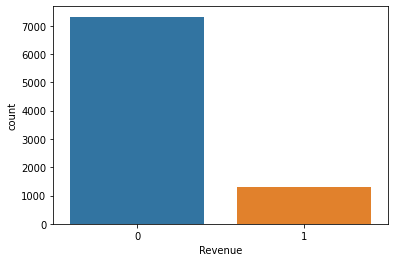

In [106]:
sns.countplot(x=y_train);

상당히 불균형 클래스인 것을 알 수 있습니다.   
major값인 class 0으로 모든 예측을 수행해 보겠습니다.

In [107]:
major = y_train.mode()[0]
y_pred = [major] * len(y_train)

# test에 대한 정확도 
print('accuracy_score : ', accuracy_score(y_train, y_pred))

accuracy_score :  0.8482215270536438


평가지표 : f1 score, accuracy

# 💡 모델 돌리기
사용 모델  

* Randomforest
* xgboost

순서 

1. 모델 학습 
2. 평가지표 계산 및 비교
3. 교차검증(CV)
4. 하이퍼 파라미터 튜닝
5. 이를 각 모델별로 반복하고 최종 모델 채택

## Randomforest

In [108]:
pipe = make_pipeline(
    OrdinalEncoder(), 
    SimpleImputer(), 
    RandomForestClassifier(random_state=337)
)
dists = {
    'simpleimputer__strategy': ['mean', 'median', 'most_frequent'], 
    'randomforestclassifier__n_estimators': list(range(10, 100, 10)), 
    'randomforestclassifier__max_depth': [5, 10, 15, 20, None], 
    'randomforestclassifier__max_features': [3, 5, 7, 9],
    'randomforestclassifier__class_weight': ['balanced']
}
clf = RandomizedSearchCV(
    pipe, 
    param_distributions=dists, 
    n_iter=100, 
    cv=3, 
    scoring='accuracy',  
    verbose=1,
    n_jobs=-1
)

md = clf.fit(X_train, y_train);

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   17.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  2.1min finished


In [109]:
print('최적 하이퍼파라미터: ', md.best_params_)
print('accuracy: ', md.best_score_)

최적 하이퍼파라미터:  {'simpleimputer__strategy': 'most_frequent', 'randomforestclassifier__n_estimators': 50, 'randomforestclassifier__max_features': 5, 'randomforestclassifier__max_depth': 20, 'randomforestclassifier__class_weight': 'balanced'}
accuracy:  0.9011702004402734


In [110]:
# f1 score 구하기
model = md.best_estimator_
cross_val_score(model, X_train, y_train, scoring="f1", cv = 5).mean()

0.6306563065638054

RandomizedSearchCV를 이용하여 최적의 하이퍼 파라미터를 구하고, accuracy를 구하였습니다.   
기준모델의 accuracy score : 0.8482215270536438  
위 모델의 accuracy score : 0.9017495075889236  <- win!

k-fold CV로 교차검증을 한 결과 평균 0.6660688655439445가 나왔습니다. 

In [111]:
# n_iter의 값을 조금 더 올려서 해보겠습니다. (유의미한 결과가 없었음)

In [112]:
# pipe2 = make_pipeline(
#     OrdinalEncoder(), 
#     SimpleImputer(), 
#     RandomForestClassifier(random_state=337)
# )
# dists2 = {
#     'simpleimputer__strategy': ['mean', 'median', 'most_frequent'], 
#     'randomforestclassifier__n_estimators': list(range(10, 100, 10)), 
#     'randomforestclassifier__max_depth': [5, 10, 15, 20, None], 
#     'randomforestclassifier__max_features': [3, 5, 7, 9],
#     'randomforestclassifier__class_weight': ['balanced']
# }
# clf2 = RandomizedSearchCV(
#     pipe2, 
#     param_distributions=dists2, 
#     n_iter=500, 
#     cv=3, 
#     scoring='accuracy',  
#     verbose=1,
#     n_jobs=-1
# )

# clf2.fit(X_train, y_train);

In [113]:
# print('최적 하이퍼파라미터: ', clf2.best_params_)
# print('accuracy: ', clf2.best_score_)

In [114]:
# f1 score 구하기
# model2 = clf2.best_estimator_
# cross_val_score(model2, X_train, y_train, scoring="f1", cv = 5).mean()

## xgboost

In [115]:
pipe3 = make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    XGBClassifier(random_state=337)
)

dists3 = {
    'simpleimputer__strategy': ['mean', 'median', 'most_frequent'], 
    'xgbclassifier__n_estimators': [50, 150, 250, 350], 
    'xgbclassifier__max_depth': [5, 10, 15, 20, None], 
    'xgbclassifier__scale_pos_weight': [1, 3, 5, 7],
    'xgbclassifier__learning_rate' : [0.001, 0.01, 0.1, 1]
}

clf3 = RandomizedSearchCV(
    pipe3, 
    param_distributions=dists3, 
    n_iter=100, 
    cv=3, 
    scoring='accuracy',  
    verbose=1,
    random_state=337,
    n_jobs=-1
)


clf3.fit(X_train, y_train);


Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  9.5min finished


In [116]:
print('최적 하이퍼파라미터: ', clf3.best_params_)
print('accuracy: ', clf3.best_score_)

최적 하이퍼파라미터:  {'xgbclassifier__scale_pos_weight': 1, 'xgbclassifier__n_estimators': 250, 'xgbclassifier__max_depth': 5, 'xgbclassifier__learning_rate': 0.01, 'simpleimputer__strategy': 'median'}
accuracy:  0.9044143204727146


In [117]:
# f1 score 구하기
model3 = clf3.best_estimator_
cross_val_score(model3, X_train, y_train, scoring="f1", cv = 5).mean()

0.6564167376676789

RandomizedSearchCV를 이용하여 최적의 하이퍼 파라미터를 구하고, accuracy를 구하였습니다.   
기준모델의 accuracy score : 0.8482215270536438  
위 모델의 accuracy score : 0.9044143204727146  <- win!

k-fold CV로 교차검증(f1)을 한 결과 평균 0.6564167376676789가 나왔습니다.  
k-fold CV로 교차검증(f1)을 한 결과 평균 0.6660688655439445가 나왔습니다. 

## 최종 모델은 'clf(Randomforest)'입니다.
* 기준모델 accuracy score : 0.8482215270536438  
* clf(Randomforest)의 accuracy score : 0.9017495075889236  
* clf3(xgboost)의 accuracy score : 0.9044143204727146  

📎  accuracy score는 clf3이 가장 높음

* clf(Randomforest)의 교차검증(f1)을 한 결과 : 평균 0.6660688655439445  
* clf3(xgboost)의 교차검증(f1)을 한 결과 : 평균 0.6564167376676789  

📎  하지만, 교차검증 결과 clf가 더 높으므로 최종적으로 clf를 채택하겠습니다.



# 💡 모델 분석

## PermutationImportance(순열 중요도)

In [118]:
ord = OrdinalEncoder()

X = ord.fit_transform(X_train)
y = y_train

In [119]:
perm = PermutationImportance(clf, scoring = "f1", random_state = 42).fit(X, y)

In [120]:
feature_names = X_train.columns.tolist()

In [121]:
pd.Series(perm.feature_importances_, feature_names).sort_values()

VisitorType                0.000000
Month                      0.000000
Weekend                    0.005807
Informational              0.008940
Browser                    0.012258
SpecialDay                 0.012389
OperatingSystems           0.017208
Informational_Duration     0.023747
TrafficType                0.024542
Region                     0.031314
Administrative_Duration    0.070768
Administrative             0.076018
ProductRelated             0.125992
BounceRates                0.167599
ProductRelated_Duration    0.170918
ExitRates                  0.235218
PageValues                 0.660066
dtype: float64

In [122]:
eli5.show_weights(
    perm, 
    top=None, # top n 지정 가능, None 일 경우 모든 특성 
    feature_names=feature_names
)

Weight,Feature
0.6601 ± 0.0193,PageValues
0.2352 ± 0.0178,ExitRates
0.1709 ± 0.0057,ProductRelated_Duration
0.1676 ± 0.0130,BounceRates
0.1260 ± 0.0058,ProductRelated
0.0760 ± 0.0104,Administrative
0.0708 ± 0.0040,Administrative_Duration
0.0313 ± 0.0049,Region
0.0245 ± 0.0043,TrafficType
0.0237 ± 0.0026,Informational_Duration


## PDP

가장 중요해 보이는 특성 top 3  
PageValues (대상 페이지 값 및/또는 전자 상거래 완료에 대해 평균을 낸 페이지의 평균 값입니다.)  
ExitRates (해당 페이지를 마지막으로 보고 나간 유저의 비율)  
ProductRelated_Duration (이 카테고리의 페이지에서 보낸 시간입니다.)   
에 대해서 pdp plot을 그려보겠습니다. 

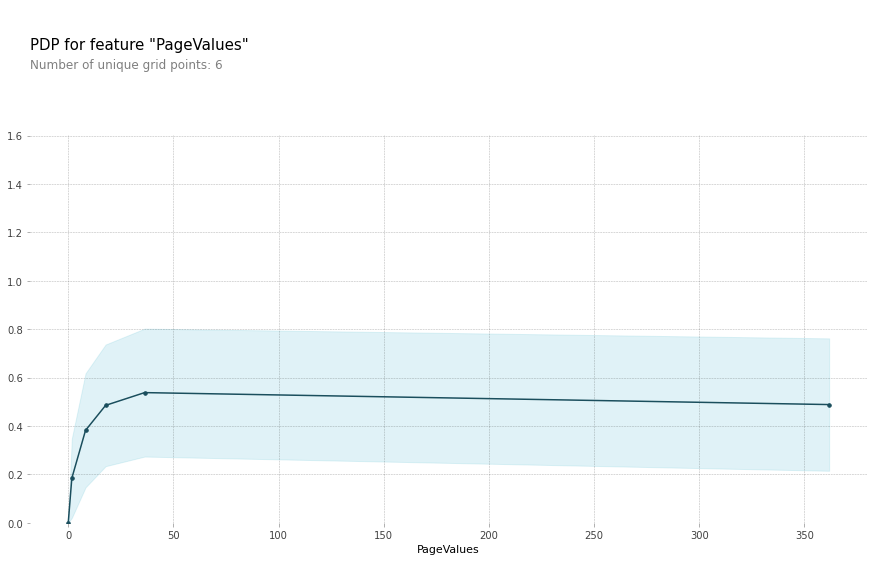

In [123]:
isolated = pdp_isolate(
    model=model, 
    dataset=X_train, 
    model_features=X_train.columns, 
    feature='PageValues',
    grid_type='percentile', 
    num_grid_points=20) 

pdp_plot(isolated, feature_name='PageValues');

해당 페이지에서 구매 완료 건수의 평균이 높을 수록 페이지에서 수익을 낼 확률이 올라갑니다.

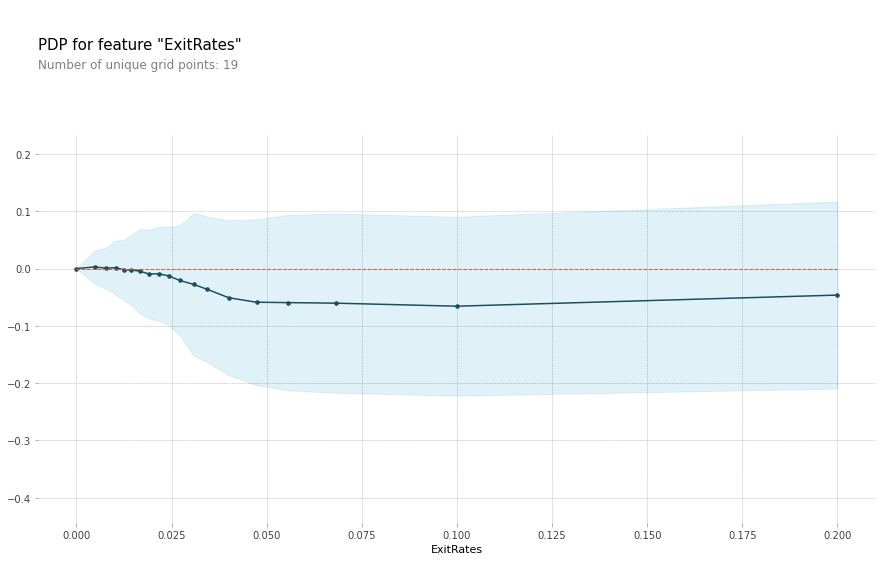

In [124]:
isolated = pdp_isolate(
    model=model, 
    dataset=X_train, 
    model_features=X_train.columns, 
    feature='ExitRates',
    grid_type='percentile', 
    num_grid_points=20) 

pdp_plot(isolated, feature_name='ExitRates');

유저가 해당 페이지를 마지막으로 나갈 확률이 높아질수록 해당 페이지에서 수익을 낼 확률은 줄어듭니다.

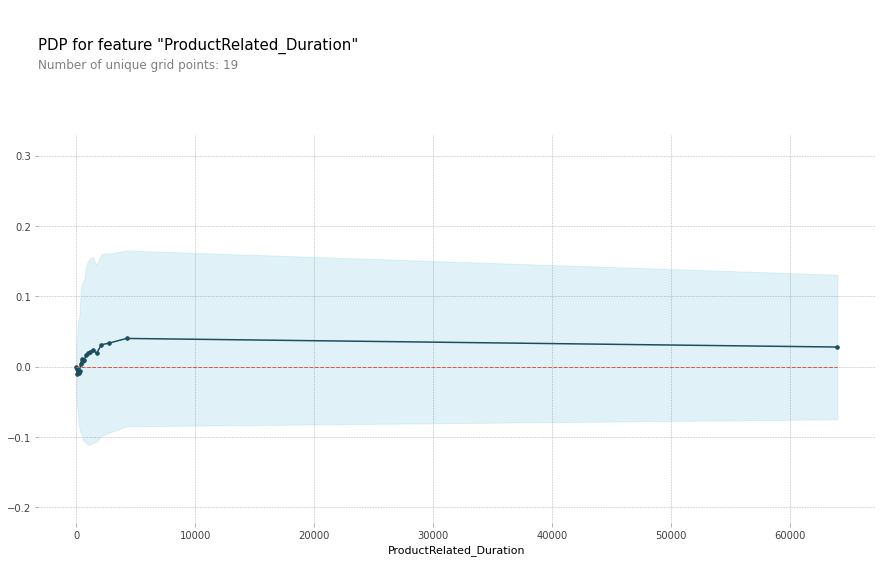

In [125]:
isolated = pdp_isolate(
    model=model, 
    dataset=X_train, 
    model_features=X_train.columns, 
    feature='ProductRelated_Duration',
    grid_type='percentile', 
    num_grid_points=20) 

pdp_plot(isolated, feature_name='ProductRelated_Duration');

해당 카테고리를 보는 시간이 많아질수록 수익을 낼 확률이 높아집니다.

### 가설 1 : 기념일에 가깝고 해당 카테고리를 보는 시간이 많아질수록 수익 확률이 높아진다.

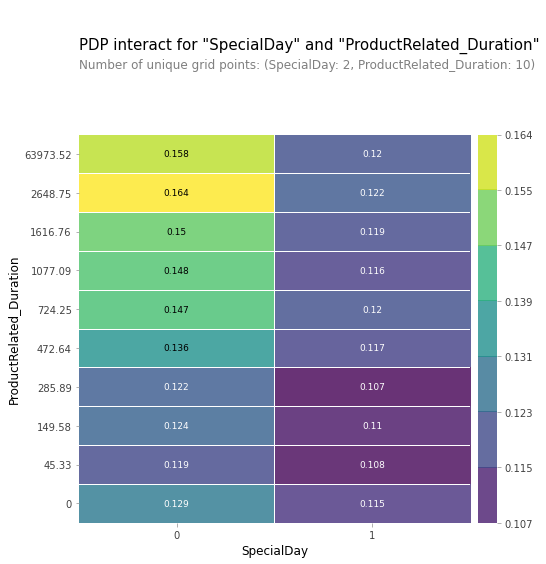

In [126]:
# 2D PDP
features = ['SpecialDay', 'ProductRelated_Duration']

interaction = pdp_interact(
    model=model, 
    dataset=X_train, 
    model_features=X_train.columns, 
    features=features
)

pdp_interact_plot(interaction, plot_type='grid', feature_names=features);

하지만 결과는 예상과 달랐습니다. 기념일에 근접할수록 해당 카테고리를 보는 시간과 수익 확률은 떨어지는 양상을 보였습니다.  
저는 기념일에 근접하는 경우(1)가 근접하지 못하는 경우(0)보다 턱없이 부족하기 때문에 정확한 분석을 하지 못했다고 판단했습니다.  
정확한 분석을 알 수 없기 때문에 가설을 받아들이기는 힘들 것 같습니다. 


## SHAP

In [127]:
# shap.TreeExplainer에서 pipeline이 아직 지원이 안되는 문제 발견
# SHAP value를 구하기 위한 모델을 따로 만들어 줍니다. 
X_train_processed = ord.transform(X_train)
X_test_processed = ord.transform(X_test)

In [128]:
model_for_shap = RandomForestClassifier(n_estimators = 90, max_features = 5, max_depth = 15, class_weight = 'balanced')
model_for_shap.fit(X_train_processed, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=15, max_features=5,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=90,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [129]:
# 예시 아무 샘플이나 하나 뽑아서 force plot을 만들어 봅시다. 
row = X_test.iloc[[3]]
explainer = shap.TreeExplainer(model_for_shap)
row_processed = ord.transform(row)
shap_values = explainer.shap_values(row_processed)
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value[1], 
    shap_values=shap_values[1], 
    features=row, 
    link='logit'
)

### 고객이 구매하게 만든 요소에 대해 더 알아보겠습니다. (revenue==1)  
다양한 예측 확률에서 파악하기 위해 새로운 dataframe을 만들어 줍니다.

In [130]:
y_pred_proba = model_for_shap.predict_proba(X_test_processed)
new_df = X_test_processed
result = np.delete(y_pred_proba, 0, axis=1)
new_df['proba'] = result
new_df['revenue'] = y_test
yes_revenue = new_df[new_df['revenue']==1]

In [131]:
# yes_revenue.sort_values(by='proba', ascending=False)
# yes_revenue.sort_values(by='proba', ascending=False).iloc[500]

In [132]:
row1 = X_test.loc[[7675]]

In [133]:
row1

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend
7675,0,0.0,0,0.0,7,376.7,0.0,0.0,53.685397,0.0,Aug,2,2,1,2,New_Visitor,0


In [134]:
row1 = X_test.loc[[7675]]
explainer = shap.TreeExplainer(model_for_shap)
row_processed = ord.transform(row1)
shap_values = explainer.shap_values(row_processed)
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value[1], 
    shap_values=shap_values[1], 
    features=row1, 
    link='logit' # SHAP value를 확률로 변환해 표시합니다.
)

In [135]:
#row2
row2 = X_test.loc[[11458]]
explainer = shap.TreeExplainer(model_for_shap)
row_processed = ord.transform(row2)
shap_values = explainer.shap_values(row_processed)
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value[1], 
    shap_values=shap_values[1], 
    features=row2, 
    link='logit' # SHAP value를 확률로 변환해 표시합니다.
)

In [136]:
#row3
row3 = X_test.loc[[8348]]
explainer = shap.TreeExplainer(model_for_shap)
row_processed = ord.transform(row3)
shap_values = explainer.shap_values(row_processed)
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value[1], 
    shap_values=shap_values[1], 
    features=row3, 
    link='logit' # SHAP value를 확률로 변환해 표시합니다.
)

In [137]:
#row4
row4 = X_test.loc[[12216]]
explainer = shap.TreeExplainer(model_for_shap)
row_processed = ord.transform(row4)
shap_values = explainer.shap_values(row_processed)
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value[1], 
    shap_values=shap_values[1], 
    features=row4, 
    link='logit' # SHAP value를 확률로 변환해 표시합니다.
)